In [11]:
import torch
import torchvision
torch.cuda.is_available()

True

In [12]:
from fastai.imports import *
from fastai.vision import *
import warnings
warnings.filterwarnings('ignore')

In addition, NVidia provides special accelerated functions for deep learning in a package called CuDNN. Although not strictly necessary, it will improve training performance significantly, and is included by default in all supported fastai configurations. Therefore, if the following does not return `True`, you may want to look into why.

In [13]:
torch.backends.cudnn.enabled

True

In [14]:
PATH = "../datasets/Stanford40_actions/fastai/"

In [15]:
sz=224

In [16]:
os.listdir(PATH)

['test', 'valid', 'models', 'train']

In [17]:
os.makedirs(f'{PATH}models', exist_ok=True)

In [18]:
os.listdir(f'{PATH}valid')

['blowing_bubbles',
 'pouring_liquid',
 'watching_TV',
 'pushing_a_cart',
 'rowing_a_boat',
 'feeding_a_horse',
 'cleaning_the_floor',
 'writing_on_a_board',
 'climbing',
 'reading',
 'washing_dishes',
 'throwing_frisby',
 'fishing',
 'gardening',
 'riding_a_horse',
 'cutting_vegetables',
 'texting_message',
 'running',
 'smoking',
 'riding_a_bike',
 'using_a_computer',
 'looking_through_a_microscope',
 'cutting_trees',
 'playing_violin',
 'writing_on_a_book',
 'waving_hands',
 'shooting_an_arrow',
 'cooking',
 'fixing_a_car',
 'phoning',
 'applauding',
 'jumping',
 'drinking',
 'brushing_teeth',
 'holding_an_umbrella',
 'fixing_a_bike',
 'walking_the_dog',
 'taking_photos',
 'looking_through_a_telescope',
 'playing_guitar']

In [17]:
files = os.listdir(f'{PATH}valid/playing_guitar')[:5]
files

['playing_guitar_247.jpg',
 'playing_guitar_101.jpg',
 'playing_guitar_241.jpg',
 'playing_guitar_108.jpg',
 'playing_guitar_194.jpg']

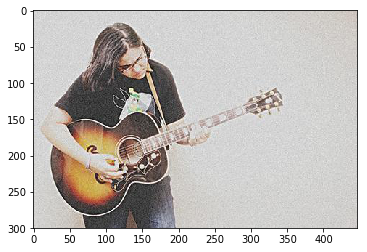

In [18]:
img = plt.imread(f'{PATH}valid/playing_guitar/{files[1]}')
plt.imshow(img)

In [19]:
# https://medium.com/@pierre_guillou/data-augmentation-by-fastai-v1-84ca04bea302
tfms = get_transforms()
# tfms = [brightness(change=(0.1, 0.9), p=1.0)]
# tfms = [contrast(scale=(0.5, 2.), p=1.)]
# tfms = [symmetric_warp(magnitude=(-0.2,0.2), p=1.)]
# tfms = [cutout(n_holes=(1,4), length=(10, 160), p=1.)]


In [20]:
def get_ex(): return open_image(f'{PATH}valid/playing_guitar/{files[1]}')

def plots_f(rows, cols, width, height, **kwargs):
    [get_ex().apply_tfms(tfms[0], **kwargs).show(ax=ax) for i,ax in enumerate(plt.subplots(
        rows,cols,figsize=(width,height))[1].flatten())]

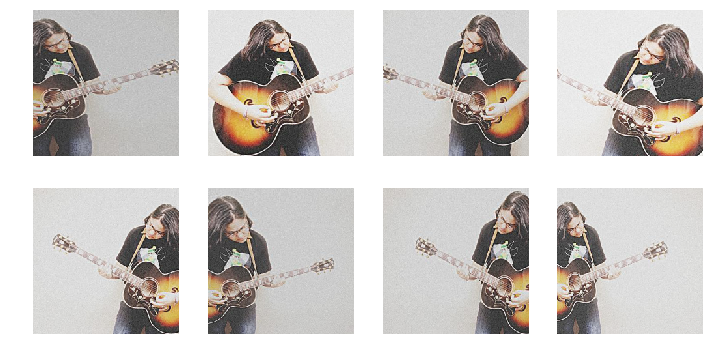

In [21]:
plots_f(2, 4, 12, 6, size=224)

In [24]:
img.shape

(300, 447, 3)

In [25]:
PIL.__version__

'6.0.0'

In [24]:
# %debug
# https://github.com/keras-team/keras/issues/5475

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

arch = models.xception
stanford_40 = ImageDataBunch.from_folder(PATH, 
                                         train=f'{PATH}train', 
                                         valid=f'{PATH}valid', 
                                         test=f'{PATH}test', 
                                         ds_tfms=tfms, 
                                         size=224, 
                                         bs=96)


IndexError: index 0 is out of bounds for axis 0 with size 0

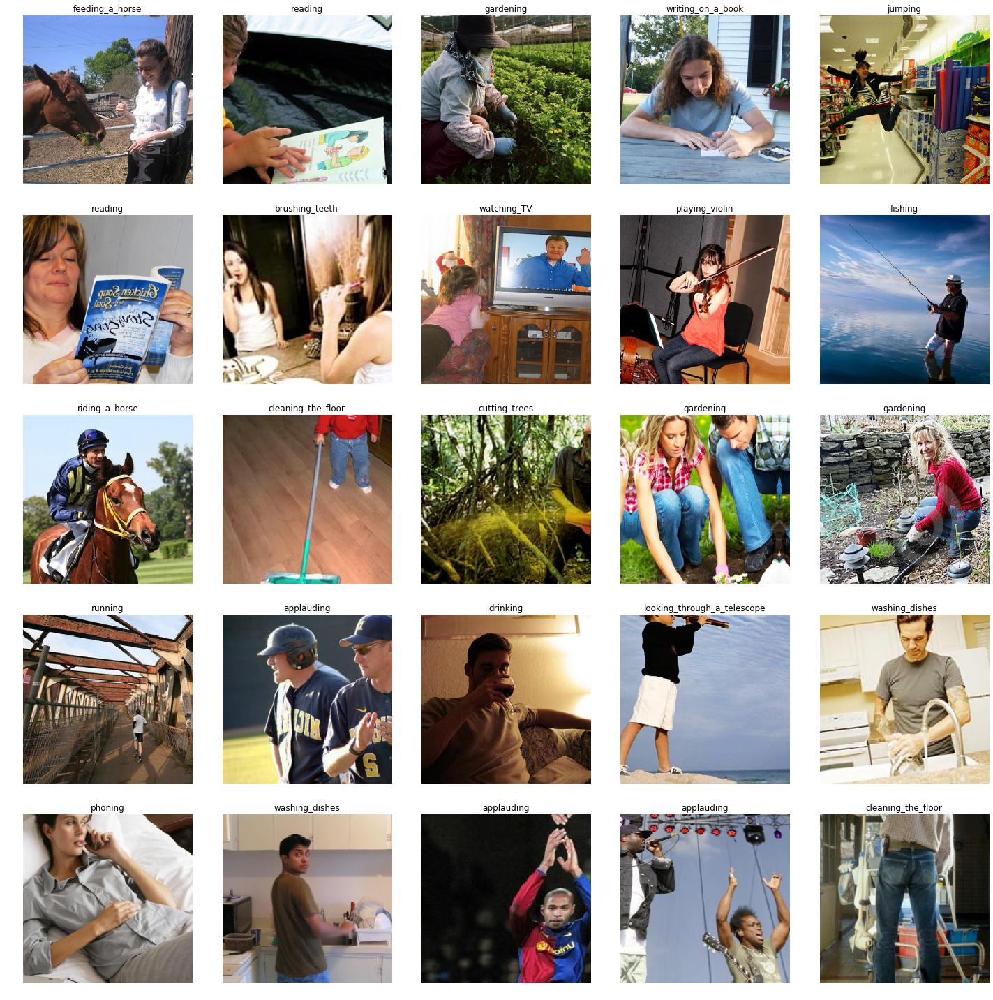

In [25]:
stanford_40.show_batch()


In [26]:
import gc; gc.collect()
torch.cuda.empty_cache()

In [27]:

learn = cnn_learner(stanford_40, 
                    models.resnet50, 
                    metrics=[error_rate, accuracy], 
                    callback_fns=[ShowGraph, BnFreeze, partial(GradientClipping, clip=0.1)])

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,2.938207,1.524013,0.421000,0.579000,01:04
1,1.905037,1.017584,0.293000,0.707000,00:48
2,1.371112,0.918896,0.269000,0.731000,00:47
3,1.039034,0.906824,0.265500,0.734500,00:48


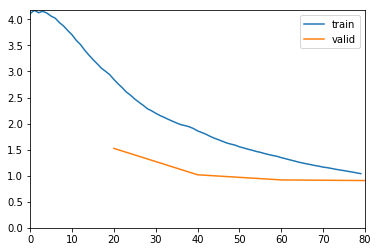

In [28]:
learn.fit_one_cycle(4)


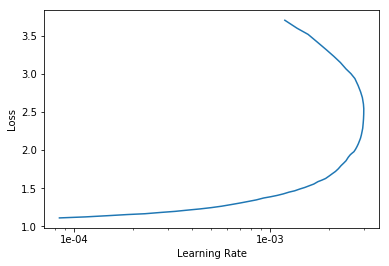

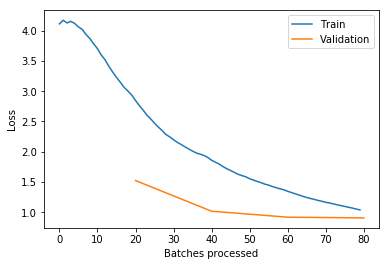

In [29]:
learn.recorder.plot()
learn.recorder.plot_losses()

In [30]:
learn.save('stage-1')

In [31]:
interp = ClassificationInterpretation.from_learner(learn)


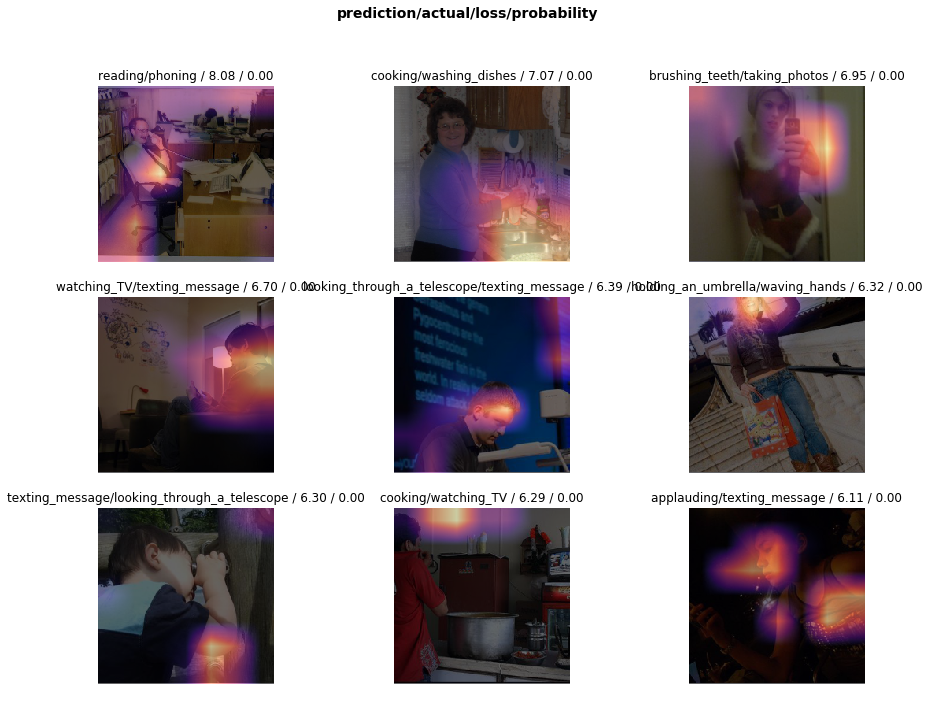

In [32]:
interp.plot_top_losses(9, figsize=(15,11))


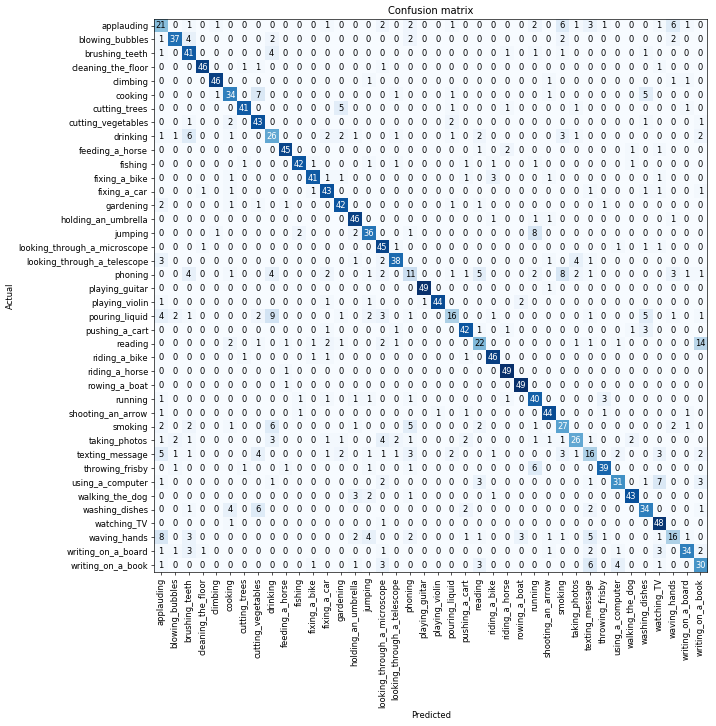

In [33]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)


In [34]:
interp.most_confused(min_val=2)


[('reading', 'writing_on_a_book', 14),
 ('pouring_liquid', 'drinking', 9),
 ('jumping', 'running', 8),
 ('phoning', 'smoking', 8),
 ('waving_hands', 'applauding', 8),
 ('cooking', 'cutting_vegetables', 7),
 ('using_a_computer', 'watching_TV', 7),
 ('applauding', 'smoking', 6),
 ('applauding', 'waving_hands', 6),
 ('drinking', 'brushing_teeth', 6),
 ('smoking', 'drinking', 6),
 ('throwing_frisby', 'running', 6),
 ('washing_dishes', 'cutting_vegetables', 6),
 ('writing_on_a_book', 'texting_message', 6),
 ('cooking', 'washing_dishes', 5),
 ('cutting_trees', 'gardening', 5),
 ('phoning', 'reading', 5),
 ('pouring_liquid', 'washing_dishes', 5),
 ('smoking', 'phoning', 5),
 ('texting_message', 'applauding', 5),
 ('waving_hands', 'texting_message', 5),
 ('blowing_bubbles', 'brushing_teeth', 4),
 ('brushing_teeth', 'drinking', 4),
 ('looking_through_a_telescope', 'taking_photos', 4),
 ('phoning', 'brushing_teeth', 4),
 ('phoning', 'drinking', 4),
 ('pouring_liquid', 'applauding', 4),
 ('taking

In [35]:
# finetuning
# learn.unfreeze()


In [36]:
# learn.fit_one_cycle(1)
# learn.recorder.plot_losses()

In [37]:
# Since the Model underperformed while training after unfreeze, 
# we would like to move to our previous best model that we have saved stage-1. 
# We will finetune to improve from here.
# learn.load('stage-1')


In [38]:
learn.lr_find()


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


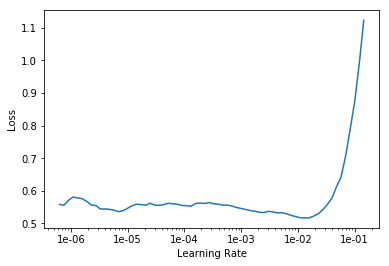

In [39]:
learn.recorder.plot()


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.573216,0.884611,0.262000,0.738000,01:02
1,0.542955,0.831347,0.243500,0.756500,00:58
2,0.482525,0.808867,0.247000,0.753000,00:58
3,0.416172,0.806051,0.241000,0.759000,00:58
4,0.348779,0.799881,0.236000,0.764000,00:58
5,0.284989,0.773113,0.223500,0.776500,00:58
6,0.241715,0.759614,0.224000,0.776000,00:58
7,0.198663,0.754944,0.216000,0.784000,00:58
8,0.166482,0.749632,0.216500,0.783500,00:58
9,0.147287,0.749792,0.215000,0.785000,00:58


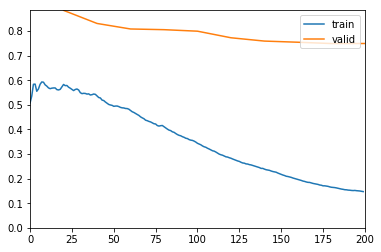

In [40]:
learn.unfreeze()
learn.fit_one_cycle(10, max_lr=slice(1e-6,1e-3))


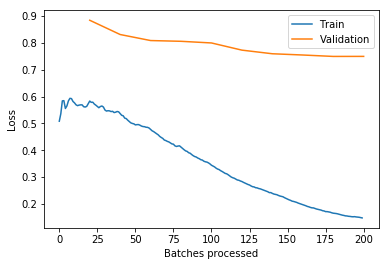

In [41]:
learn.recorder.plot_losses()

In [44]:
# Finally we use test time augmentation (TTA) to give us better result.

log_preds, y = learn.TTA()
accuracy(log_preds, y)

tensor(0.8020)

In [48]:
learn.show_graph

ShowGraph
learn: Learner(data=ImageDataBunch;

Train: LabelList (2000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
blowing_bubbles,blowing_bubbles,blowing_bubbles,blowing_bubbles,blowing_bubbles
Path: ../datasets/Stanford40_actions/fastai;

Valid: LabelList (2000 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
blowing_bubbles,blowing_bubbles,blowing_bubbles,blowing_bubbles,blowing_bubbles
Path: ../datasets/Stanford40_actions/fastai;

Test: LabelList (0 items)
x: ImageList

y: EmptyLabelList

Path: ../datasets/Stanford40_actions/fastai, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, 

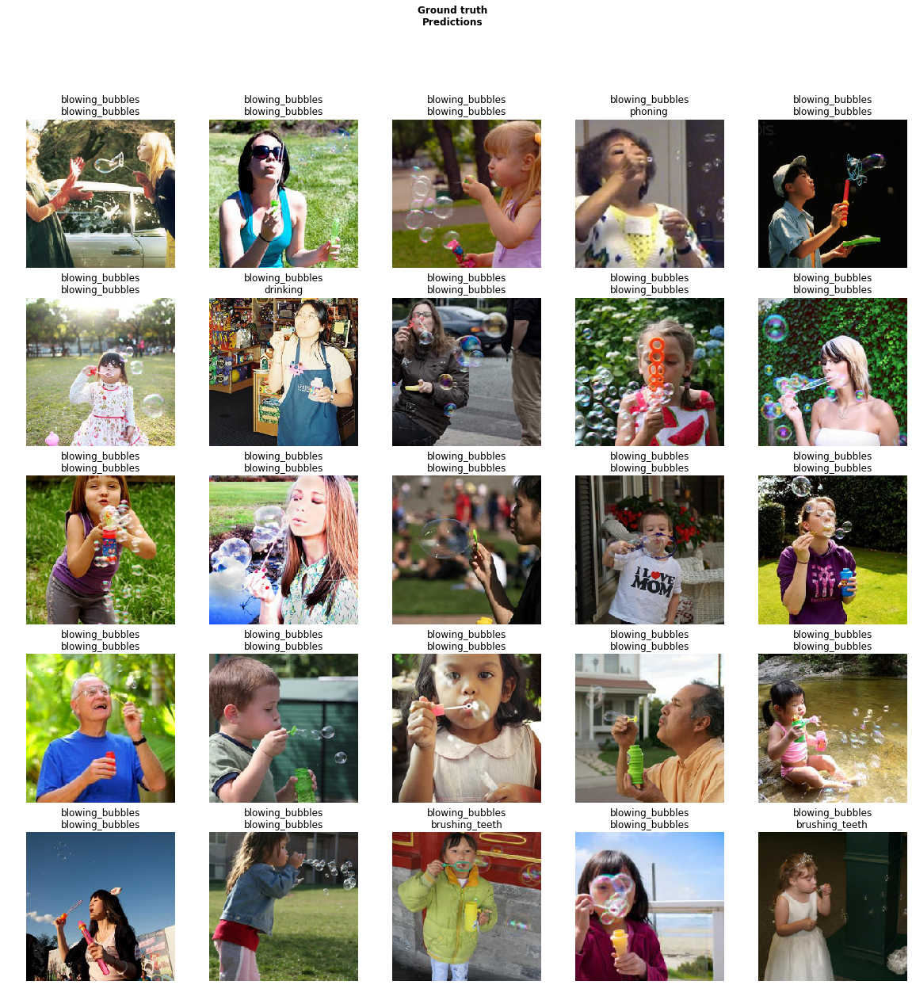

In [49]:
learn.show_results()

In [51]:
learn.save("stanford40_train50", return_path=True)


PosixPath('../datasets/Stanford40_actions/fastai/models/stanford40_train50.pth')

In [52]:
learn_reloaded = learn.load("stanford40_train50")


In [56]:
tfms = get_transforms()
# path = Path('data').resolve()
# data = (ImageList.from_folder(path)
#         .split_by_pct()
#         .label_from_folder()
#         .transform(tfms)
#         .databunch()
#         .normalize() ) 
# learn = cnn_learner(data, models.resnet50, metrics=accuracy)
# learn.fit_one_cycle(5,1e-2)

# now replace the validation dataset entry with the test dataset as a new validation dataset: 
# everything is exactly the same, except replacing `split_by_pct` w/ `split_by_folder` 
# (or perhaps you were already using the latter, so simply switch to valid='test')
data_test = (ImageDataBunch.from_folder(PATH, 
                                        train='train', 
                                        valid='test', 
                                        ds_tfms=tfms, 
                                        size=224, 
                                        bs=96)
             .normalize()
            ) 
learn_reloaded.validate(data_test.valid_dl)

[12.6211405, tensor(0.9581), tensor(0.0419)]

In [57]:
learn_reloaded.validate(data_test.train_dl)

[12.595304, tensor(0.9625), tensor(0.0375)]

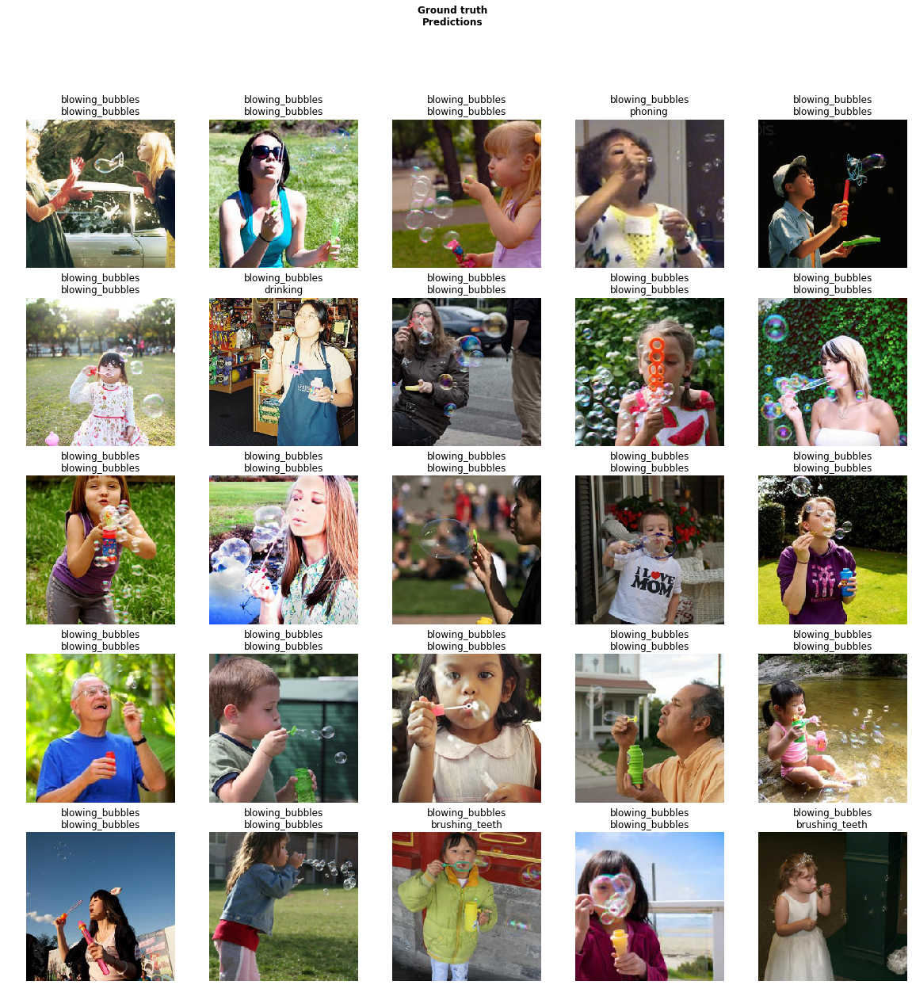

In [58]:
learn_reloaded.show_results()

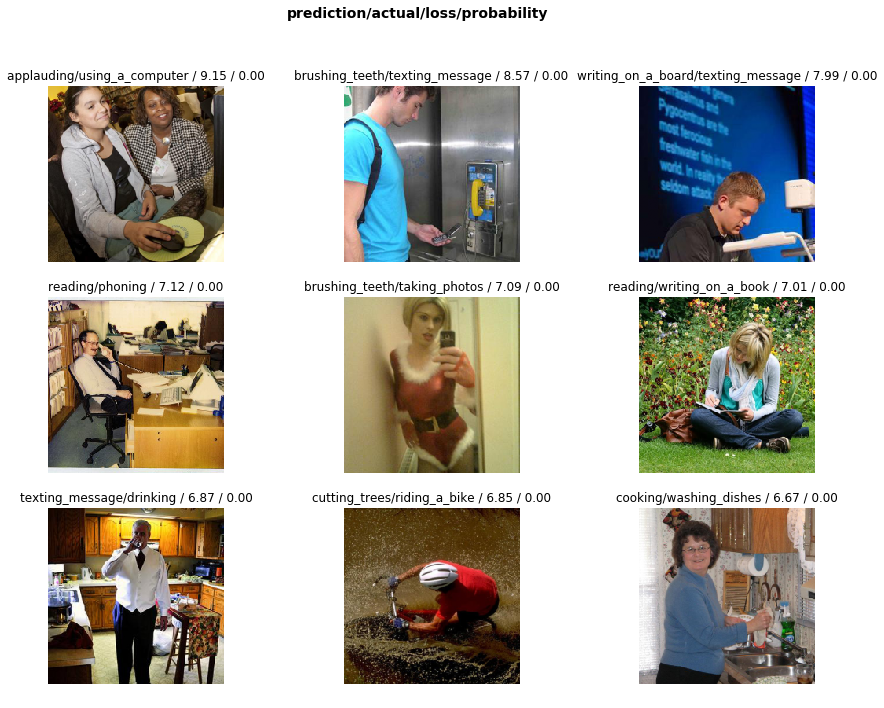

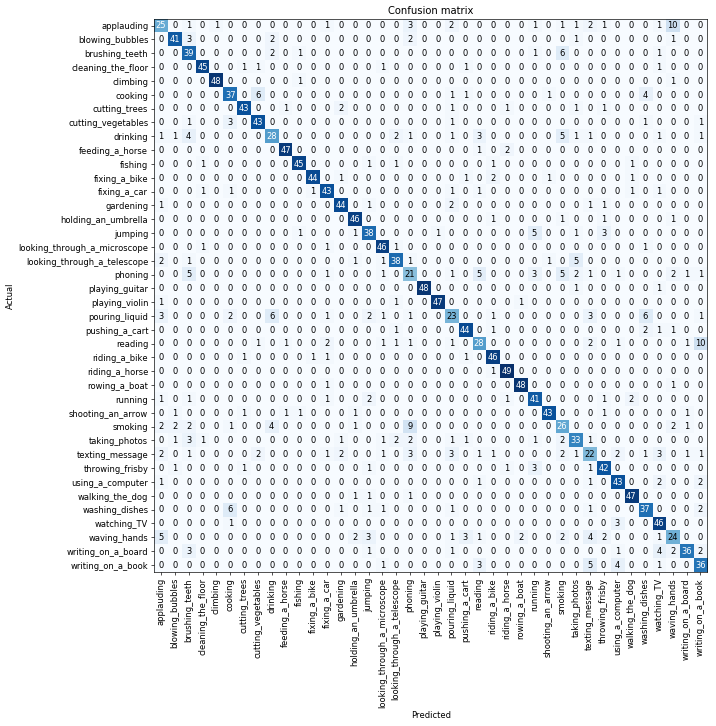

In [59]:
interp = ClassificationInterpretation.from_learner(learn)
losses,idxs = interp.top_losses()
len(data_test.valid_ds)==len(losses)==len(idxs)
interp.plot_top_losses(9, figsize=(15,11), heatmap=False)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [ ]:
interp.most_confused(min_val=2)
